In [2]:
# 기본 라이브러리
import numpy as np
import pandas as pd
import seaborn as sns

# 그래프 라이브러리
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib_inline.backend_inline

# 기본 설정 

matplotlib_inline.backend_inline.set_matplotlib_formats("png2x")
mpl.style.use("seaborn-v0_8")
mpl.rcParams.update({"figure.constrained_layout.use": True})
sns.set_context("paper") 
sns.set_palette("Set2") 
sns.set_style("whitegrid") 


plt.rc("font", family = "DejaVu Sans") # 우분투 기본폰트
plt.rcParams["axes.unicode_minus"] = False

In [3]:
# 기본 작업 경로 설정
import os
notebook_path = os.path.abspath("project_3_git/code/2_YOLO_finetunning.ipynb")
notebook_dir = os.path.dirname(notebook_path)
os.chdir(notebook_dir)

# 현재 작업 디렉토리 출력
print("Current working directory: ", os.getcwd())

Current working directory:  /mnt/e/py_data/project_3_git/code


In [4]:
import json

def openjson(path):

    with open(path, encoding="cp949") as f:
        data = json.load(f)
    return data

trainjsons = []
testjsons  = []
validjsons = []

trainjsons.extend([i for i in openjson('../data/image_data/train/label/train/train_anger.json')])
trainjsons.extend([i for i in openjson('../data/image_data/train/label/train/train_happy.json')])
trainjsons.extend([i for i in openjson('../data/image_data/train/label/train/train_panic.json')])
trainjsons.extend([i for i in openjson('../data/image_data/train/label/train/train_sadness.json')])

validjsons.extend([i for i in openjson('../data/image_data/train/label/val/val_anger.json')])
validjsons.extend([i for i in openjson('../data/image_data/train/label/val/val_happy.json')])
validjsons.extend([i for i in openjson('../data/image_data/train/label/val/val_panic.json')])
validjsons.extend([i for i in openjson('../data/image_data/train/label/val/val_sadness.json')])

testjsons.extend([i for i in openjson('../data/image_data/test/label/test_anger.json')])
testjsons.extend([i for i in openjson('../data/image_data/test/label/test_happy.json')])
testjsons.extend([i for i in openjson('../data/image_data/test/label/test_panic.json')])
testjsons.extend([i for i in openjson('../data/image_data/test/label/test_sadness.json')])

In [5]:
train_directory_path = '../data/image_data/train/img/train/'
valid_directory_path = '../data/image_data/train/img/val/'
test_directory_path = '../data/image_data/test/image/'


In [6]:
import os

def find_images(root_dir):
    # 이미지 확장자 목록
    image_extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp'}
    
    image_files = []
    
    for root, dirs, files in os.walk(root_dir):
        for file in files:
            if os.path.splitext(file)[1].lower() in image_extensions:
                image_files.append(os.path.join(root, file))
    
    return image_files

paths_train = find_images(train_directory_path)
paths_valid = find_images(valid_directory_path)
paths_test = find_images(test_directory_path)

### yolo v10 의 어노테이션 이해
- yaml 파일 이해
    data.yaml
    
    ```text
    train: ../train/images
    val: ../valid/images

    nc: 3
    names: ['head', 'helmet', 'person']
    ```

- txt 파일
    
    ```class_id center_x center_y width height```
    ```text
    1 0.617 0.3594420600858369 0.114 0.17381974248927037
    1 0.094 0.38626609442060084 0.156 0.23605150214592274
    1 0.295 0.3959227467811159 0.13 0.19527896995708155
    ```

In [7]:
# train 어노테이션 만들기 포 욜로10
import cv2
import os

# 클래스 이름을 클래스 ID로 매핑하는 딕셔너리
class_names = ['anger', 'sad', 'panic', 'happy']
class_to_id = {name: idx for idx, name in enumerate(class_names)}

def convert_bbox_to_yolo_format(image_size, bbox):
    """
    바운딩 박스를 YOLO 형식으로 변환.
    :param image_size: (width, height) 이미지 크기
    :param bbox: {'minX': float, 'minY': float, 'maxX': float, 'maxY': float} 바운딩 박스 좌표
    :return: (x_center, y_center, width, height) YOLO 형식의 바운딩 박스
    """
    dw = 1.0 / image_size[0]
    dh = 1.0 / image_size[1]
    x_center = (bbox['minX'] + bbox['maxX']) / 2.0
    y_center = (bbox['minY'] + bbox['maxY']) / 2.0
    width = bbox['maxX'] - bbox['minX']
    height = bbox['maxY'] - bbox['minY']
    
    # YOLO 형식에 맞게 좌표를 정규화
    x_center = x_center * dw
    y_center = y_center * dh
    width = width * dw
    height = height * dh
    
    return (x_center, y_center, width, height)

def save_annotations(json_data, output_dir, image_size):
    """
    이미지를 yolo 에 맞게
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for item in json_data:
        image_file = item['filename']
        image_name, _ = os.path.splitext(image_file)
        txt_file_path = os.path.join(output_dir, f"{image_name}.txt")
        
        with open(txt_file_path, 'w') as f:
            # Iterate over annotations (A, B, C)
            annot = item.get('annot_A')
            print(annot)
            if annot:
                bbox = annot['boxes']
                print(bbox)
                face_exp = item['faceExp_uploader']
                print(face_exp)
                class_id = class_to_id.get(face_exp, -1)
                if class_id == -1:
                    class_id = 3
                print(class_id)
                if class_id != -1:
                    yolo_bbox = convert_bbox_to_yolo_format(image_size, bbox)
                    print(yolo_bbox)
                    f.write(f"{class_id} {' '.join(map(str, yolo_bbox))}\n")
                    print(f"{class_id} {' '.join(map(str, yolo_bbox))}\n")


In [8]:
output_directory = '../data/yolo_data/./train/'

for i in paths_train:
    name_of_file = (i.split('/')[-1].split('.')[0])
    for j in trainjsons:
        if name_of_file in j['filename']:

            # Check if annotation file already exists before saving
            image_file = j['filename']
            image_name, _ = os.path.splitext(image_file)
            txt_file_path = os.path.join(output_directory, f"{image_name}.txt")
            
            if not os.path.exists(txt_file_path):
                image = cv2.imread(i)
                h, w, _ = image.shape
                # 상대 위치로 결정되기 때문에 파일 크기가 필요하다
                image_size = (w, h)
                print(name_of_file)
                print(image_size)
                print(j['annot_A']['boxes'])
                save_annotations([j], output_directory, image_size)
                print('')
            else:
                print(f"Annotation file already exists: {txt_file_path}")


In [9]:
output_directory = '../data/yolo_data/./val/'

for i in paths_valid:
    name_of_file = (i.split('/')[-1].split('.')[0])
    for j in validjsons:
        if name_of_file in j['filename']:

            # Check if annotation file already exists before saving
            image_file = j['filename']
            image_name, _ = os.path.splitext(image_file)
            txt_file_path = os.path.join(output_directory, f"{image_name}.txt")
            
            if not os.path.exists(txt_file_path):
                image = cv2.imread(i)
                h, w, _ = image.shape
                # 상대 위치로 결정되기 때문에 파일 크기가 필요하다
                image_size = (w, h)
                print(name_of_file)
                print(image_size)
                print(j['annot_A']['boxes'])
                save_annotations([j], output_directory, image_size)
                print('')
            else:
                print(f"Annotation file already exists: {txt_file_path}")


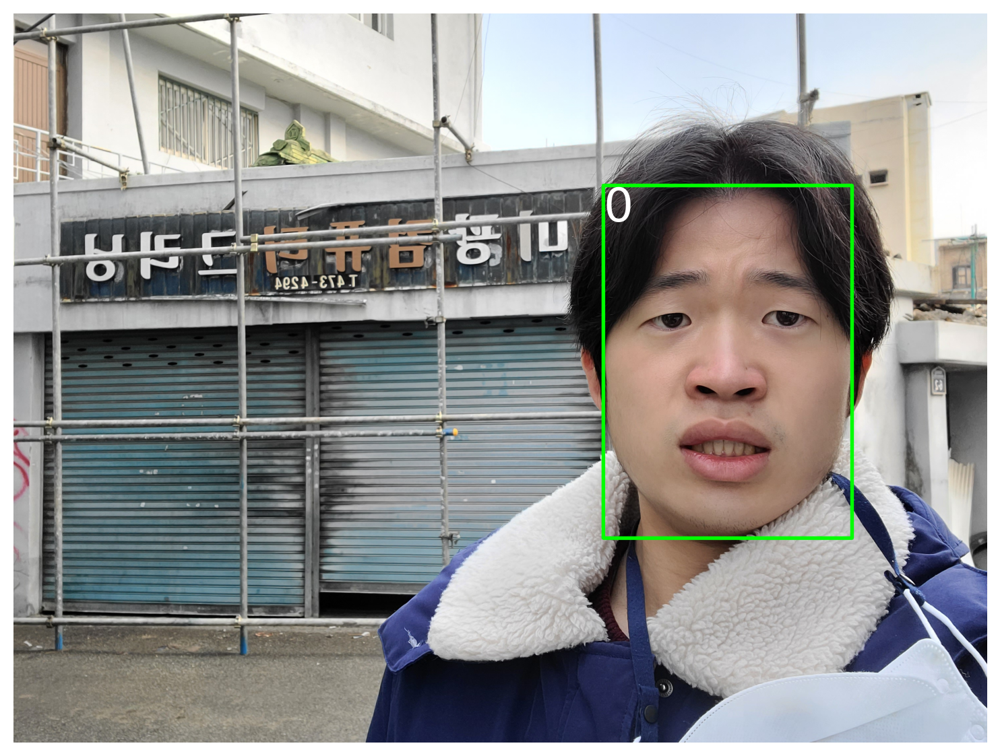

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def convert_yolo_to_bbox(image_size, yolo_bbox):
    """
    욜로 상대 좌표(점과 크기) 에서 절대 좌표로 변환
    """
    img_height, img_width = image_size
    x_center, y_center, width, height = yolo_bbox
    
    # Convert from relative coordinates to absolute coordinates
    x_center_abs = x_center * img_width
    y_center_abs = y_center * img_height
    width_abs = width * img_width
    height_abs = height * img_height
    
    # Calculate min and max coordinates
    minX = int(x_center_abs - (width_abs / 2.0))
    minY = int(y_center_abs - (height_abs / 2.0))
    maxX = int(x_center_abs + (width_abs / 2.0))
    maxY = int(y_center_abs + (height_abs / 2.0))
    
    return minX, minY, maxX, maxY

path_test_img = '../data/yolo_data/train/'
name = 'jwaccb50afa0212a340d07cd6204f4cd10aa5ab0b162c162a57f11431f7d3kdhp'
image = cv2.imread(path_test_img + name +'.jpg')
h, w ,_ = image.shape
label_path = path_test_img + name + '.txt'
with open(label_path, 'r') as f:
    label__ =  f.read().split()

label__ = [float(i) for i in  label__]

recovered_pic_bb = convert_yolo_to_bbox((h,w),label__[1:])

minX, minY, maxX, maxY = recovered_pic_bb

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
cv2.rectangle(image_rgb, (minX, minY), (maxX, maxY), (0, 255, 0), 10)
plt.axis('off')

plt.imshow(image_rgb)

plt.text(minX, minY, int(label__[0]), color='white', fontsize=25,
         ha='left', va='top')


plt.show()

### 모델 훈련 중 잘못된 음수 값

```text
train: WARNING ⚠️ /mnt/e/py_data/project_3_git/data/yolo_data/train/0xah1dfff2988dd0bb1002299e49a2e81221721df2086792404682f191894jnl2.jpg: ignoring corrupt image/label: negative label values [  -0.037574   -0.049603]
train: WARNING ⚠️ /mnt/e/py_data/project_3_git/data/yolo_data/train/xuiz83a96877b841898d16f32a9276e7a8d779d8d68f458e2816e296d6558w6em.jpg: ignoring corrupt image/label: negative label values [  -0.081222]
```

- 2개 데이터 포인트 이기 때문에 삭제 해도 무방하다고 판단.


https://github.com/MuhammadMoinFaisal/Computervisionprojects/blob/main/Train-Custom-YOLOv10/YOLOv10_Training_Custom_Dataset.zip

In [11]:
import urllib.request

url = "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt"

filename = os.path.basename(url)
filepath = os.path.join('yolov10n.pt')
urllib.request.urlretrieve(url, filepath)
print(f"Downloaded: {filepath}")

Downloaded: yolov10n.pt


In [12]:
!pip install --upgrade ultralytics torch
!pip install git+https://github.com/THU-MIG/yolov10.git
!pip cache purge

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.1/871.1 kB 20.6 MB/s eta 0:00:00
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.1.34
    Uninstalling ultralytics-8.1.34:
      Successfully uninstalled ultralytics-8.1.34
  Cloning https://github.com/THU-MIG/yolov10.git to /tmp/pip-req-build-npslkktj
  Running command git clone --filter=blob:none --quiet https://github.com/THU-MIG/yolov10.git /tmp/pip-req-build-npslkktj
  Resolved https://github.com/THU-MIG/yolov10.git to commit cd2f79c70299c9041fb6d19617ef1296f47575b1
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.1.34-py3-none-any.whl size=731411 sha256=771911484e7d20891362b2c39009eef6122c5b567b29f46b6dc5cab9b6a50790
  Stored in directory: /tmp/pip-ephem-wheel-cache-32rofs6c/wheels/d0/55/9e/5864f4bd6d2efcc6c2f915828bba6e8944fb5bcd5d782ca9f3
Successfully built

In [13]:
!pip install huggingface_hub

In [14]:
from ultralytics.models import YOLOv10

model_for_trian = YOLOv10(filepath)
model_for_trian.train(data="/mnt/e/py_data/project_3_git/data/yolo_data/wassup_data.yaml", epochs=10, imgsz=512)

New https://pypi.org/project/ultralytics/8.2.82 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.34 🚀 Python-3.11.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3060, 12287MiB)
engine/trainer: task=detect, mode=train, model=yolov10n.pt, data=/mnt/e/py_data/project_3_git/data/yolo_data/wassup_data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, val_period=1, cache=False, device=None, workers=8, project=None, name=train13, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, 

train: Scanning /mnt/e/py_data/project_3_git/data/yolo_data/train.cache... 5992 images, 2 backgrounds, 0 corrupt: 100%|██████████| 5994/5994 [00:00<?, ?it/s]
val: Scanning /mnt/e/py_data/project_3_git/data/yolo_data/val.cache... 1199 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1199/1199 [00:00<?, ?it/s]


Plotting labels to /mnt/e/py_data/project_3_git/yolov10/runs/detect/train13/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 8 dataloader workers
Logging results to /mnt/e/py_data/project_3_git/yolov10/runs/detect/train13
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       1/10      1.97G     0.7652      2.081     0.9989     0.7633      5.542     0.9738         10        512: 100%|██████████| 375/375 [06:10<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:54<00:00,  1.45s/it]


                   all       1199       1199      0.441      0.618      0.522      0.435

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       2/10      1.87G     0.6944      1.183     0.9106     0.7331      2.175     0.9076         10        512: 100%|██████████| 375/375 [05:34<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:52<00:00,  1.39s/it]


                   all       1199       1199      0.465      0.645      0.503      0.415

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       3/10      1.87G     0.6814     0.9359      0.906     0.7159      1.199     0.9026         10        512: 100%|██████████| 375/375 [05:51<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:54<00:00,  1.42s/it]


                   all       1199       1199      0.699      0.705      0.736      0.601

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       4/10      1.87G     0.6605     0.8385     0.8979     0.6912     0.9473     0.8949         10        512: 100%|██████████| 375/375 [05:24<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:52<00:00,  1.39s/it]


                   all       1199       1199      0.736      0.765      0.794      0.664

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       5/10      1.87G     0.6468     0.7586     0.8928     0.6748     0.7903     0.8888         10        512: 100%|██████████| 375/375 [05:40<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:49<00:00,  1.29s/it]


                   all       1199       1199      0.719      0.749      0.787       0.67

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       6/10      1.87G     0.6317     0.7188     0.8869     0.6565      0.724     0.8815         10        512: 100%|██████████| 375/375 [05:17<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:48<00:00,  1.28s/it]


                   all       1199       1199      0.715      0.785      0.813      0.691

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       7/10      1.87G     0.6184     0.6624     0.8842     0.6381     0.6445     0.8778         10        512: 100%|██████████| 375/375 [05:13<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:50<00:00,  1.33s/it]


                   all       1199       1199      0.792      0.762      0.852      0.723

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       8/10      1.87G     0.6069     0.6378     0.8803     0.6247     0.6166     0.8727         10        512: 100%|██████████| 375/375 [05:26<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:49<00:00,  1.30s/it]


                   all       1199       1199      0.793      0.794      0.864      0.743

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


       9/10      1.87G     0.5976     0.5916     0.8797     0.6118     0.5663     0.8693         10        512: 100%|██████████| 375/375 [05:26<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:53<00:00,  1.40s/it]


                   all       1199       1199      0.801      0.831      0.884      0.762

      Epoch    GPU_mem     box_om     cls_om     dfl_om     box_oo     cls_oo     dfl_oo  Instances       Size


      10/10      1.87G     0.5796     0.5383     0.8731      0.591     0.5165     0.8644         10        512: 100%|██████████| 375/375 [05:27<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:48<00:00,  1.28s/it]


                   all       1199       1199      0.805      0.797      0.872      0.752

10 epochs completed in 1.076 hours.
Optimizer stripped from /mnt/e/py_data/project_3_git/yolov10/runs/detect/train13/weights/last.pt, 5.7MB
Optimizer stripped from /mnt/e/py_data/project_3_git/yolov10/runs/detect/train13/weights/best.pt, 5.7MB

Validating /mnt/e/py_data/project_3_git/yolov10/runs/detect/train13/weights/best.pt...
Ultralytics YOLOv8.1.34 🚀 Python-3.11.0 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3060, 12287MiB)
YOLOv10n summary (fused): 285 layers, 2695976 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [01:00<00:00,  1.58s/it]


                   all       1199       1199      0.802       0.83      0.884      0.762
                 anger       1199        300      0.727      0.803      0.836      0.719
                   sad       1199        300       0.84      0.734      0.882       0.76
                 panic       1199        300      0.725      0.843      0.845      0.721
                 happy       1199        299      0.916       0.94       0.97      0.848
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to /mnt/e/py_data/project_3_git/yolov10/runs/detect/train13


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f3ca564c450>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [31]:
# 훈련된 모델 불러오기

model_transfered = YOLOv10('../yolov10/runs/detect/train1/weights/best.pt')


0: 384x512 1 anger, 66.0ms
Speed: 9.2ms preprocess, 66.0ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 512)


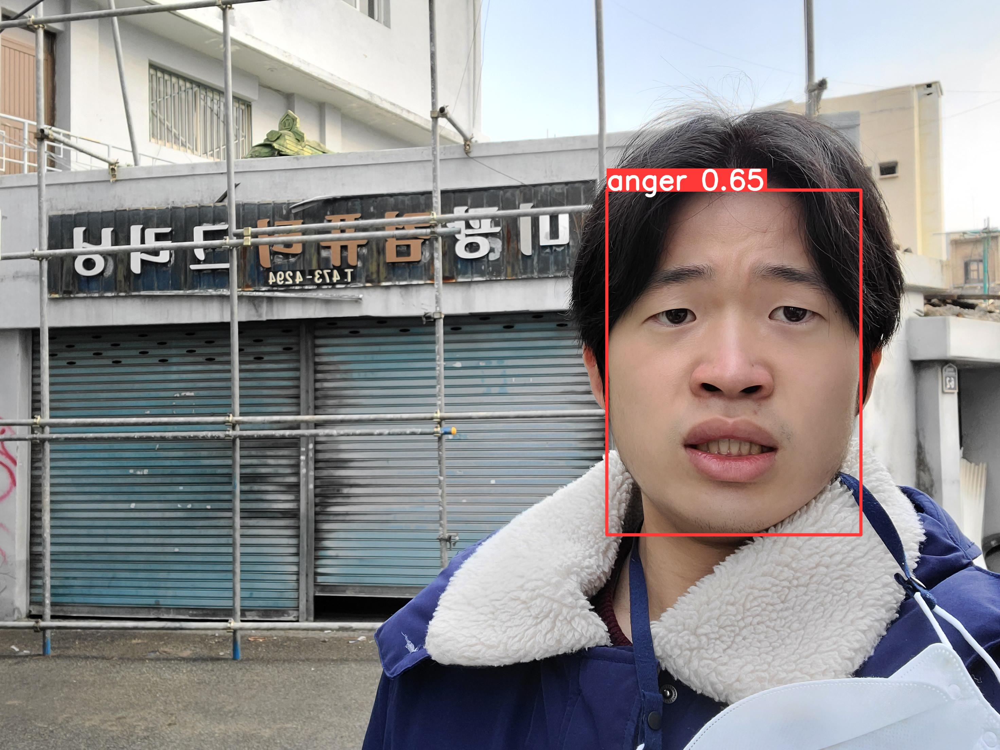

In [33]:
model_transfered(image)[0].show()